In [22]:
import numpy as np
import pandas as pd
import os
import re
from collections import Counter
from rapidfuzz import process, fuzz

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer
from underthesea import word_tokenize, pos_tag, ner, dependency_parse, chunk

from sklearn.metrics import confusion_matrix

from nltk.corpus import words
from latex2sympy2 import latex2sympy
import requests
import cv2
import json


def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.00, HeightSpace = 0.00):
    from matplotlib import pyplot as plt 
    import matplotlib.gridspec as gridspec
    
    gs = gridspec.GridSpec(nRows, nCols)     
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(30,15))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')

        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')

    plt.show()
pd.set_option('display.max_colwidth', None)

In [29]:
# file_name = '[Preprocessed]_DS_crawls_data_2022_11_08.csv'
file_name = '[Data]_DS_crawls_data_2022_11_07.csv'
if os.name == "nt":
    file_path = r"G:\My Drive\Work\ICM - GE\1. Dataset"

else:
    file_path = '/Users/admin/Library/CloudStorage/GoogleDrive-huypnm@galaxy.com.vn/My Drive/Work/ICM - GE/1. Dataset'

data_path = os.path.join(file_path, file_name)
data = pd.read_csv(data_path)
data.describe(include='all')

,QuestionID,ImageURL,ImageOCR,token,word_count,formula,type,tnf_ratio
count,140206,140020,140020,139452,139452,139452,138884,138884.000000
unique,139898,139609,133902,104366,385,105043,3,NaN
top,ight) \),[],0,[],0,[],Math and Text,NaN
freq,104,308,308,13100,13100,15215,100223,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.483021
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.338003
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.178571
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.475594
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.774674


In [24]:
def handle_formula(t:str):
    """
        Function that split a text that contain both text and formula(in Latex form)

        Args:
            t (str): a string type input

        Returns:
            t (str): a string contain only text
            formulas (list): a list contain all possible formula 
    """
    s = t
    formulas = []
    # math_operators =["+", "-", "*", "/", "=", "<", ">"]
    begin = s.find("\(")
    while begin != -1:
        # Open and Close of a math expression in Latex
        begin = s.find("\(")
        end = s.find("\)")
        # Append when it is a math expression
        formula = s[begin + 2:end]
        if begin != -1:
            formulas.append(formula)
        s = s[end+2:]

    for formula in formulas:
        if len(formula) == 0:
            continue
        t = "".join(t.split(formula))

    return t, formulas

# ===================================================================
def retrieve_text_only(s:str):
    """
        Retrieve text from entire string contain both formula
    """
    text, _ = handle_formula(s)
    text = clean_string(text)
    return text
    
# ===================================================================
def retrieve_formula_only(s:str):
    """
        Retrieve formula from entire string contain both formula and text 
    """
    _, formulas = handle_formula(s)
    return formulas

# ===================================================================
def calculate_ratio(s:str, opt='text'):
    """
        Return ratio between text and math expression
    """
    text, formulas = handle_formula(s)

    text_measure = clean_string(text)
    formula_measure = " ".join(formulas)

    if opt == 'text':
        return len(text_measure) / (len(text_measure) + len(formula_measure) + 10e-9) # Prevent division by zero error

    else:
        return len(formula_measure) / (len(text_measure) + len(formula_measure) + 10e-9) # Prevent division by zero error 

# ===================================================================
def text_analyze(s:str, word_dict):
    """
        Analyze string text and return it's case

        Args:
            s (str): a string type text
        Returns
            A string type indicate which kind the text belong to
            "Math only"
            "Text only"
            "Math and Text"
    """
    text, formulas = handle_formula(s)
    text_measure = clean_string(text)
    formula_measure = " ".join(formulas)
    # This will take 'Text only' case
    if len(formulas) == 0:
        return "Text only"

    token_words = text_to_sequence(s, word_dict)
    # This will take "Math only" case
    if (
        # When string is empty
        str.isspace(text_measure) or 
        # When formulas length outnumber text length
        len(text_measure) < len(formula_measure) or 
        # When only 1 type of token exist
        len(set(token_words)) <= 1):
        return 'Math only'

    return "Math and Text"

# ===================================================================
def create_dict(corpus:list, normalization=True):
    """
        Create dictionary of words from corpus

        Args:
            corpus (list): list contain Latex strings
            normalization (bool) : if True will using tf-idf weighted to normalize dictionary 
        Returns:
            a dictionary type contain all token words
    """
    vocab_corpus = []
    for sentence in corpus:
        token_sentence = tokenize(sentence)
        vocab_corpus.extend(token_sentence)

    vocab_corpus = sorted(set(vocab_corpus))
    dict_vocab = {j: i for i, j in enumerate(vocab_corpus, start=0)}

    if normalization:
        norm_vectorize = dict_normalization(corpus, vocab_corpus)
        for index, key in enumerate(dict_vocab):
            dict_vocab[key] = norm_vectorize[index]

    return dict_vocab

# ===================================================================
def dict_normalization(corpus, word_dict):
    """ 
        Return a dictionary normalized by Tf-Idf
    """
    vectorizer = TfidfVectorizer(analyzer='word', min_df=0, vocabulary=word_dict).fit(corpus)
    # norm_values = vectorizer.toarray().std(axis=0)
    # return {i:j for i, j in zip(word_dict, norm_values)}
    return vectorizer.idf_

# ===================================================================
def clean_string(t:str, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~'):
    table = str.maketrans(filters, len(filters)*" ")
    t = t.translate(table)
    t = re.sub(r'\d+', '', t) # Remove number
    return word_tokenize(t.lower(), format='text')

# ===================================================================
def tokenize(s:str, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~'):
    """
        Tokenize a string into a list of string

        Args:
            s (str): Latex string
            filters (str): String stopword

        Returns:
            list : contain all string words (exclude math expression) being splitted from the original text
    """
    t = retrieve_text_only(s)
    return clean_string(t, filters).split()

# ===================================================================
def text_to_sequence(t:str, word_dict:None):
    """
        Convert string of words into list of index from dictionary

        Args:
            t (str): string of words
            word_dict (dict): dictionary of words

        Returns:
            list of index words in original string
    """
    # After cleaned, split into char level
    token_words = tokenize(t)

    if word_dict != None:
        sequence = list(map(lambda x: word_dict.get(x, -1), token_words))

    else:
        sequence = token_words

    return sequence

In [ ]:
# ===================================================================
def dominated_depedency_parsing(s, searching_parsing='compound'):
    cleaned_text = re.sub(r'\d+', '', retrieve_text_only(s))
    if len(cleaned_text) == 0 or str.isspace(cleaned_text):
        return 'Not contain text'
    list_entity = dependency_parse(cleaned_text)

    unique_entity = np.array(np.unique(np.array(list_entity)[:,2], return_counts=True)).transpose()
    df_entity = pd.DataFrame(
        unique_entity, columns=['Entity', 'Frequency'])
    df_entity['Frequency'] = df_entity['Frequency'].astype('int')

    multi_max = df_entity[df_entity['Frequency'] == df_entity['Frequency'].max()]['Entity'].tolist()

    if searching_parsing in multi_max:
        return searching_parsing

    else:
        return multi_max[0]


# ===================================================================
def string_pos_tagging(s):
    pos_tagging = pos_tag(s)
    pos_tagging = np.array(pos_tagging)[:,1] # Get entity onlys

    unique, counts = np.unique(pos_tagging, return_counts=True)
    unique = [item for item in unique]
    
    return unique, counts, pos_tagging


# ===================================================================
def pos_ratio_diff(df, opt='max'):
    # First get all name entity
    temp_samples = []
    unique_entity = []

    for i in df.index:
        # Remove all number out of the strings
        lookup_text = retrieve_text_only(df['Lookup Text'][i])
        question_text = retrieve_text_only(df['Question Text'][i])

        if len(lookup_text) == 0 or str.isspace(lookup_text):
            lookup_pos = dict(zip(unique_entity, [0] * len(unique_entity)))
        
        else:
            unique, counts, pos_tagging = string_pos_tagging(lookup_text)
            unique_entity.extend(unique)
            lookup_pos = dict(zip(unique, counts / len(pos_tagging)))


        if len(question_text) == 0 or str.isspace(question_text):
            question_pos = dict(zip(unique_entity, [0] * len(unique_entity)))
        
        else:
            unique, counts, pos_tagging = string_pos_tagging(question_text)
            unique_entity.extend(unique)
            question_pos = dict(zip(unique, counts / len(pos_tagging)))

        unique_entity = list(set(unique_entity))
        pos_list = [lookup_pos, question_pos]

        if opt == 'max':
            l_highest_fre = max(lookup_pos.values())
            q_highest_fre = max(question_pos.values())

            lnq_highest_fre = [
                max(lookup_pos, key=lookup_pos.get),
                max(question_pos, key=question_pos.get)
            ]

            temp_samples.append(
                {
                    'lookup_max_fre': l_highest_fre,
                    'question_max_fre': q_highest_fre,
                    'lnq_max_pos': str(lnq_highest_fre)
                }
            )

        else:
            index_max = np.argmax(map(len, np.array(pos_list)))

            pos_diff = {
                key: 
                abs(pos_list[index_max][key] - pos_list[index_max - 1].get(key, 0)) 
                for key in pos_list[index_max]}

            pos_diff = sum(list(pos_diff.values()))
            temp_samples.append({'pos_diff_lnq_ratio':pos_diff})

    # Then create a dataframe contain all the name, then add it into dataframe by order
    if opt == 'max':
        columns = [
            'lookup_max_fre', 
            'question_max_fre', 
            'lnq_max_pos'
            ]

    else:
        columns = ['pos_diff_lnq_ratio']

    df_r = pd.DataFrame(columns=columns)
    for i in temp_samples:
        df_sample = pd.DataFrame(i, index=[0])
        df_r = pd.concat([df_r, df_sample], ignore_index =True)

    # df_pos_diff.fillna(value=-1, inplace=True)

    return df_r

# ===================================================================
def get_chunk_dict(s):
    """
        Dictionary of possible IOB tag in the sentence
    """
    list_chunk = chunk(retrieve_text_only(s))
    chunk_dict = {}
    for i in list_chunk:
        if chunk_dict.get(i[2], 0) == 0:
            chunk_dict[i[2]] = [i[0]]
        
        else:
            chunk_dict[i[2]] += [i[0]]

    return chunk_dict

In [ ]:
# ===================================================================
def crawls_image(url, path , img_name='temp_1'):
    image_path = os.path.join(path, f'{img_name}.jpg')

    with open(image_path, 'wb') as handle:
        response = requests.get(url, stream=True)

        if not response.ok:
            print(response)

        for block in response.iter_content(1024):
            if not block:
                break

            handle.write(block)
    
    img = cv2.imread(image_path)

    return img

# ===================================================================
def request_API(payload, post_url='https://data-checking.herokuapp.com/data-checking'):
    r = requests.post(post_url, {'image': payload})
    return r.text


In [ ]:
# ===================================================================
def is_english(t):
    """
        Testing check english words
    """
    token = tokenize(t)
    
    if len(token) == 0:
        return False
    unique_bool, counts = np.unique([word in set(words.words()) for word in token], return_counts=True)
    # Always return False first and True later
    idx_unique = np.argmax(counts)
    is_en = unique_bool[idx_unique]
    if is_en == True: is_en = True if counts[idx_unique] > counts[idx_unique - 1] * 2 else False

    return is_en

In [ ]:
# ===================================================================
def SegmentByOtsu(Image):
    from skimage.filters import threshold_multiotsu
    IM = Image.copy()
    
    if(len(IM.shape) == 3):
        IM = cv2.cvtColor(IM, cv2.COLOR_RGB2GRAY)
        
    thresh = threshold_multiotsu(IM)
    Mask0 = (IM > thresh[0])
    Mask1 = (IM > thresh[1])
    Mask0 = Mask0.astype(int)
    Mask1 = Mask1.astype(int)

    return Mask0, Mask1, thresh

In [25]:
"""
QuestionID	ImageURL	ImageOCR
"""
# total_text = data["ImageOCR"].tolist()
# total_text = [retrieve_text_only(q) for q in total_text]
# dictionary = create_dict(total_text)
display('Preprocessed' in file_name)
if 'Preprocessed' in file_name:
    data['is_en'] = data['ImageOCR'].apply(lambda x: is_english(x))
    pass

else:
    # Retrieve token from string text
    data["token"] = data["ImageOCR"].apply(lambda x: tokenize(x))

    data["word_count"] = data["token"].apply(lambda x: len(x))

    # Retrieve formulas
    data['formula'] = data['ImageOCR'].apply(lambda x: retrieve_formula_only(x))

    # Analyze if string contain only 'Text' or only 'Formula' or contain Both
    data["type"] = data["ImageOCR"].apply(lambda x: text_analyze(x))

    data['tnf_ratio'] = data["ImageOCR"].apply(lambda x: calculate_ratio(x))

    # data['is_en'] = data['ImageOCR'].apply(lambda x: is_english(x))


False

In [26]:
data.shape

(139452, 8)

In [40]:
file_name = '[Preprocessed]_DS_crawls_data_2022_11_08.csv'
# file_name = '[Data]_DS_crawls_data_2022_11_07.csv'
if os.name == "nt":
    file_path = r"G:\My Drive\Work\ICM - GE\1. Dataset"

else:
    file_path = '/Users/admin/Library/CloudStorage/GoogleDrive-huypnm@galaxy.com.vn/My Drive/Work/ICM - GE/1. Dataset'

data_path = os.path.join(file_path, file_name)
data_t = pd.read_csv(data_path)
data_t.shape

(140206, 8)

In [39]:
file_name = '[Preprocessed]_DS_crawls_data_2022_11_08.csv'
data.to_csv(os.path.join(file_path, file_name), encoding='utf-8', line_terminator='\n',index=False)

In [9]:
if os.name == 'nt':
    image_path = r"G:\My Drive\Work\ICM - GE\1. Dataset\temp_images"
else:
    image_path = '/Users/admin/Library/CloudStorage/GoogleDrive-huypnm@galaxy.com.vn/My Drive/Work/ICM - GE/1. Dataset/temp_images'

In [38]:
i = 13

13

array([151, 216])

245.2665274064171

228.23473987852785

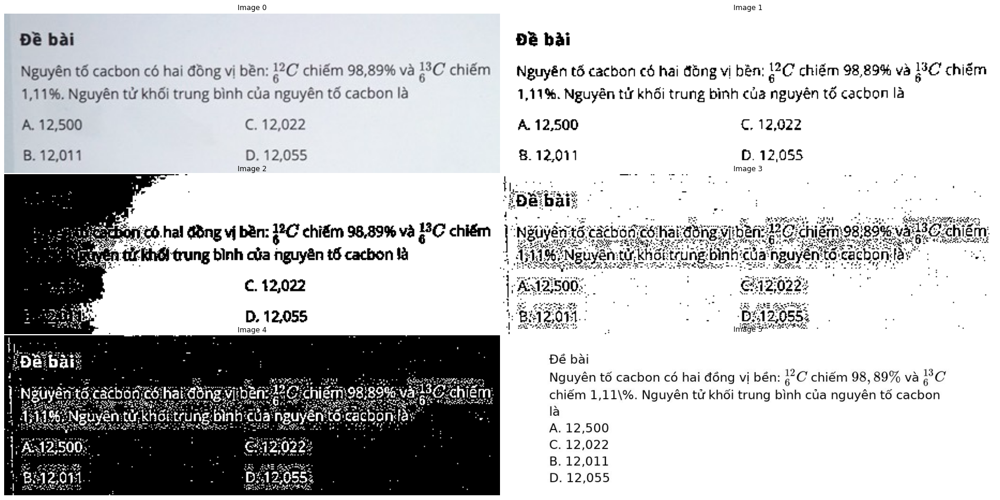

QuestionID                                                                                                                                                                                          b45fafe6-a4be-11ec-8385-3e98d26ed10c
ImageURL                                                                                                                                           https://s3.stag.icankids.com.vn/uploads/question/b37259c0-a4be-11ec-aff6-effb0425a586
ImageOCR      Đề bài\nNguyên tố cacbon có hai đồng vị bền: \( { }_{6}^{12} C \) chiếm \( 98,89 \% \) và \( { }_{6}^{13} C \) chiếm 1,11\%. Nguyên tử khối trung bình của nguyên tố cacbon là\nA. 12,500\nC. 12,022\nB. 12,011\nD. 12,055
token                                                ['đề_bài', 'nguyên_tố', 'cacbon', 'có', 'hai', 'đồng_vị', 'bền', 'chiếm', 'và', 'chiếm', 'nguyên_tử', 'khối', 'trung_bình', 'của', 'nguyên_tố', 'cacbon', 'là', 'a', 'c', 'b', 'd']
word_count                                                          

In [41]:
test_case = data.loc[i]
image_url = test_case['ImageURL']
render_url = request_API(image_url)
render_url = json.loads(render_url)['image_render']
display(i)
temp_1 = crawls_image(test_case['ImageURL'], image_path, 'temp_1')
mask_1, mask_2 , threshold = SegmentByOtsu(temp_1)
bit_img = mask_1 & mask_2
mask_3 = cv2.adaptiveThreshold(cv2.cvtColor(temp_1, cv2.COLOR_RGB2GRAY),255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,5,2)
mask_4 = cv2.bitwise_not(mask_3) & cv2.bitwise_not(mask_2)
temp_2 = crawls_image(render_url, image_path, 'temp_2')

if temp_1.shape[0] > temp_1.shape[1] * 1.5: temp_1 = np.rot90(temp_1, 1)
display(threshold)
# display(temp_2.shape)s
display(np.mean(temp_2))
display(np.mean(mask_3))
ShowImage([temp_1, mask_1, mask_2, mask_3, mask_4, temp_2], 3, 2)
display(test_case)
i += 1

In [94]:
test_case = data.loc[12]
display(test_case)

QuestionID                                                                                                                                                                                                                                           ab929f1e-a4cf-11ec-8385-3e98d26ed10c
ImageURL                                                                                                                                                                                            https://s3.stag.icankids.com.vn/uploads/question/aa036ee0-a4cf-11ec-aff6-effb0425a586
ImageOCR                                     1.The book Amelie is reiding now is about the Big Bang theory.\nA.which 2.In winter, many Swedes travel to a countly C.where there's a lot of sunshine.\n3. Which is the space tourism service C.who is being advertised on website.\nA.that
token         [the, book, amelie, is, reiding, now, is, about, the, big, bang, theory, a, which, in, winter, many, swedes, travel, to, a, countly, c, wher

In [ ]:
data[data['is_en']== True]

In [ ]:
data[data['type'] == 'Math only'].sample(5)

In [8]:
"""
    Summary type
"""
fig = px.histogram(data, x=["type"], text_auto=True, barmode='group')
fig.update_layout(title_text="Total number of each type")
fig.show()

In [12]:
test_df = data.loc[:500].copy()
test_df.reset_index(inplace=True, drop=True)
test_df['is_en'] = test_df['ImageOCR'].apply(lambda x: is_english(x))

In [14]:
test_df.shape

(501, 9)

In [13]:
"""
    Check english
"""
fig = px.histogram(test_df, x=["is_en"], text_auto=True, barmode='group')
fig.update_layout(title_text="Total number of english sentence and non-english sentence")
fig.show()

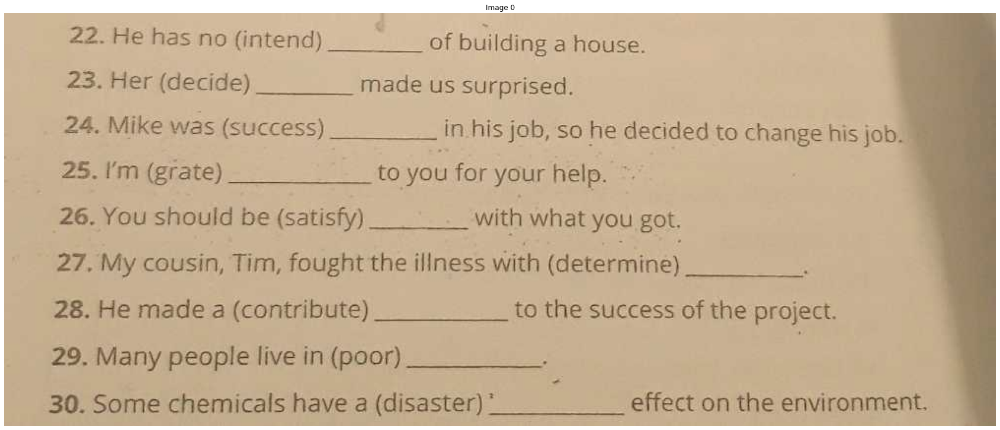

In [34]:
test_en = test_df[test_df['is_en'] == True]
test_en.head()
test_case = test_en.iloc[5]
test_img = test_case['ImageURL']
temp_1 = crawls_image(test_img, image_path, 'temp_1')
ShowImage([temp_1],1,1)

In [35]:
display(pd.DataFrame(test_case[['ImageOCR']]).transpose())

,ImageOCR
71,"22. He has no (intend) of building a house.\n23. Her (decide) made us surprised.\n24. Mike was (success) in his job, so he decided to change his job.\n25. I'm (grate) to you for your help.\n26. You should be (satisfy) with what you got.\n27. Miy cousin, Tim, fought the illness with (determine)\n28. He made a (contribute) to the success of the project.\n29. Many people live in (poor)\n30. Some chemicals have a (disaster) effect on the environment."


In [11]:
"""
    Text n formula ratio
"""
kind = data[(data['type'] == 'Math and Text')]
fig = ff.create_distplot([
                    np.array(kind['tnf_ratio'], dtype=float)], 
                    group_labels=['Text and Formula ratio'],
                        bin_size=.05,
                        # histnorm= '',
                        curve_type='normal',
                        show_curve=True
                        )
fig.update_layout(title_text="Text and formula retio")
fig.show()